<a href="https://colab.research.google.com/github/mhaque4/mhaque4/blob/main/House_Price_predication.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
##Importing the Libraries
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import mean_squared_error
import math
from sklearn.metrics import r2_score
np.set_printoptions(precision=4)
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
plt.style.use('fivethirtyeight')
import warnings
warnings.filterwarnings("ignore")
sns.set(font_scale=1.5)

In [ ]:
##Data Wrangling
import os

# List files in the dataset directory
for dirname, _, filenames in os.walk('/content/drive/My Drive'):
    for filename in filenames:
        print(os.path.join('/content/drive/My Drive', filename))


Streaming output truncated to the last 5000 lines.
/content/drive/My Drive/Tr-pi_1175.jpg
/content/drive/My Drive/Tr-pi_1186.jpg
/content/drive/My Drive/Tr-pi_1183.jpg
/content/drive/My Drive/Tr-pi_1188.jpg
/content/drive/My Drive/Tr-pi_1181.jpg
/content/drive/My Drive/Tr-pi_1187.jpg
/content/drive/My Drive/Tr-pi_1184.jpg
/content/drive/My Drive/Tr-pi_1185.jpg
/content/drive/My Drive/Tr-pi_1189.jpg
/content/drive/My Drive/Tr-pi_1182.jpg
/content/drive/My Drive/Tr-pi_1197.jpg
/content/drive/My Drive/Tr-pi_1196.jpg
/content/drive/My Drive/Tr-pi_1191.jpg
/content/drive/My Drive/Tr-pi_1192.jpg
/content/drive/My Drive/Tr-pi_1198.jpg
/content/drive/My Drive/Tr-pi_1190.jpg
/content/drive/My Drive/Tr-pi_1194.jpg
/content/drive/My Drive/Tr-pi_1195.jpg
/content/drive/My Drive/Tr-pi_1193.jpg
/content/drive/My Drive/Tr-pi_1202.jpg
/content/drive/My Drive/Tr-pi_1200.jpg
/content/drive/My Drive/Tr-pi_1206.jpg
/content/drive/My Drive/Tr-pi_1199.jpg
/content/drive/My Drive/Tr-pi_1208.jpg
/content/driv

In [ ]:
import pandas as pd

# Define the paths to the CSV files in Google Drive
train_path = '/content/drive/My Drive/house-prices-advanced-regression-techniques/train.csv'
test_path = '/content/drive/My Drive/house-prices-advanced-regression-techniques/test.csv'


In [ ]:
import pandas as pd

# Assuming the CSV file is located at the specified path
train_path = '/content/drive/My Drive/train.csv'

# Read the CSV file into a DataFrame
train = pd.read_csv(train_path)

# Now you can call the info() method
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [ ]:
##Data Exploration
import pandas as pd

# Assuming the CSV file is located at the specified path
test_path = '/content/drive/My Drive/test.csv'

# Read the CSV file into a DataFrame
test = pd.read_csv(test_path)

# Now you can call the info() method
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSSubClass     1459 non-null   int64  
 2   MSZoning       1455 non-null   object 
 3   LotFrontage    1232 non-null   float64
 4   LotArea        1459 non-null   int64  
 5   Street         1459 non-null   object 
 6   Alley          107 non-null    object 
 7   LotShape       1459 non-null   object 
 8   LandContour    1459 non-null   object 
 9   Utilities      1457 non-null   object 
 10  LotConfig      1459 non-null   object 
 11  LandSlope      1459 non-null   object 
 12  Neighborhood   1459 non-null   object 
 13  Condition1     1459 non-null   object 
 14  Condition2     1459 non-null   object 
 15  BldgType       1459 non-null   object 
 16  HouseStyle     1459 non-null   object 
 17  OverallQual    1459 non-null   int64  
 18  OverallC

In [ ]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [ ]:
test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [ ]:
train.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
                  ...   
MoSold             int64
YrSold             int64
SaleType          object
SaleCondition     object
SalePrice          int64
Length: 81, dtype: object

In [ ]:
test.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
                  ...   
MiscVal            int64
MoSold             int64
YrSold             int64
SaleType          object
SaleCondition     object
Length: 80, dtype: object

In [ ]:
##
print("Statistics of the target variable (SalePrice) :")
print("--------------------------------")
print(train['SalePrice'].describe())
print("Skewness: %f" % (train['SalePrice']).skew())

Statistics of the target variable (SalePrice) :
--------------------------------
count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64
Skewness: 1.882876


In [ ]:
AC= train['SalePrice']
mean=AC.mean()
median=AC.median()
mode=AC.mode()
print('Mean: ',mean,'\nMedian: ',median,'\nMode: ',mode[0])

Mean:  180921.19589041095 
Median:  163000.0 
Mode:  140000


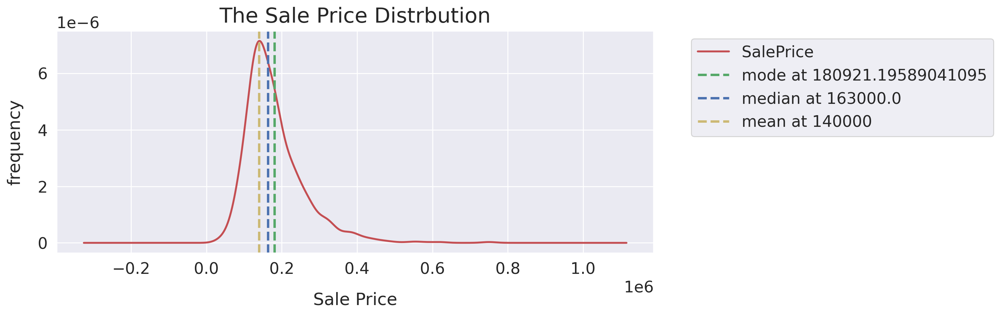

In [ ]:
AC.plot(kind='density', figsize=(10, 4), linewidth=2, color='r')
        #')
plt.xlabel("Sale Price", labelpad=15)
plt.ylabel("frequency", labelpad=15)
plt.title("The Sale Price Distrbution", y=1.012, fontsize=22);
measurements = [mean, median, mode[0] ]
names = ["mode", "median", "mean"]
colors = ['g', 'b', 'y']
for measurement, name, color in zip(measurements, names, colors):
    plt.axvline(x=measurement, linestyle='--', linewidth=2.5, label='{0} at {1}'.format(name, measurement), c=color)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2 );

In [ ]:
test.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
count,1459.000000,1459.000000,1232.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1444.000000,1458.000000,...,1458.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000
mean,2190.000000,57.378341,68.580357,9819.161069,6.078821,5.553804,1971.357779,1983.662783,100.709141,439.203704,...,472.768861,93.174777,48.313914,24.243317,1.794380,17.064428,1.744345,58.167923,6.104181,2007.769705
std,421.321334,42.746880,22.376841,4955.517327,1.436812,1.113740,30.390071,21.130467,177.625900,455.268042,...,217.048611,127.744882,68.883364,67.227765,20.207842,56.609763,30.491646,630.806978,2.722432,1.301740
min,1461.000000,20.000000,21.000000,1470.000000,1.000000,1.000000,1879.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000
25%,1825.500000,20.000000,58.000000,7391.000000,5.000000,5.000000,1953.000000,1963.000000,0.000000,0.000000,...,318.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2007.000000
50%,2190.000000,50.000000,67.000000,9399.000000,6.000000,5.000000,1973.000000,1992.000000,0.000000,350.500000,...,480.000000,0.000000,28.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000
75%,2554.500000,70.000000,80.000000,11517.500000,7.000000,6.000000,2001.000000,2004.000000,164.000000,753.500000,...,576.000000,168.000000,72.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000
max,2919.000000,190.000000,200.000000,56600.000000,10.000000,9.000000,2010.000000,2010.000000,1290.000000,4010.000000,...,1488.000000,1424.000000,742.000000,1012.000000,360.000000,576.000000,800.000000,17000.000000,12.000000,2010.000000


In [ ]:
train.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [ ]:
##Outliers detection
#collect the numerical value to use it in the plot below.
num_var = [f for f in train.columns if train.dtypes[f] != 'object']
num_var.remove('SalePrice')
num_var.remove('Id')
# cato_var = [f for f in train.columns if train.dtypes[f] == 'object']

In [ ]:
train55= train[num_var]
test55 = test[num_var]


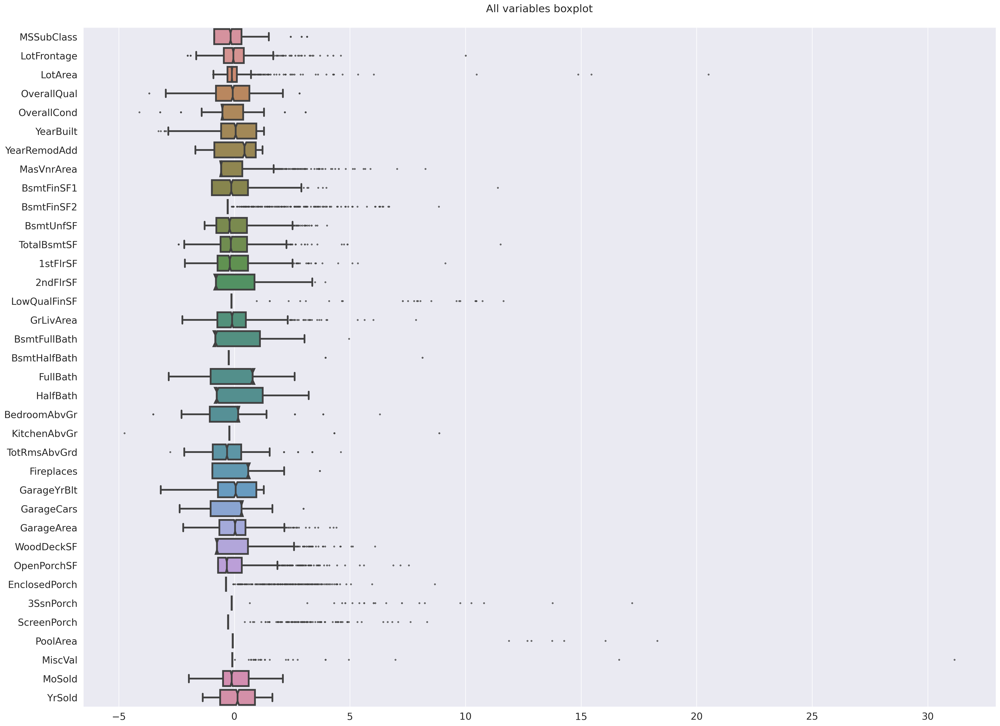

In [ ]:
## for train data
def var_standardized(var):
    var_stand = (var-var.mean())/var.std()
    return var_stand

train_stand = var_standardized(train55)
fig,ax = plt.subplots(figsize=(25,20))

sns.boxplot(data=train_stand, orient='h', fliersize=2, linewidth=3, notch=True,
                 saturation=0.5, ax=ax )

ax.set_title('All variables boxplot\n')
plt.show()

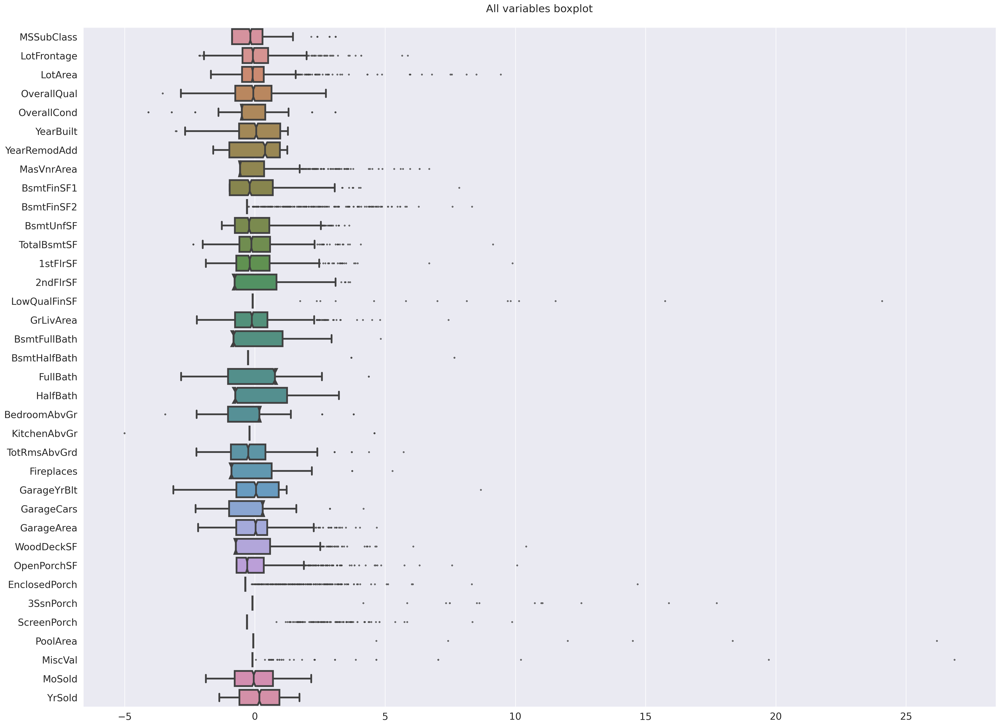

In [ ]:
## FOR TEST DATA
def var_standardized(var):
    var_stand = (var-var.mean())/var.std()
    return var_stand

test_stand = var_standardized(test55)
fig,ax = plt.subplots(figsize=(25,20))

sns.boxplot(data=test_stand, orient='h', fliersize=2, linewidth=3, notch=True,
                 saturation=0.5, ax=ax)

ax.set_title('All variables boxplot\n')
plt.show()

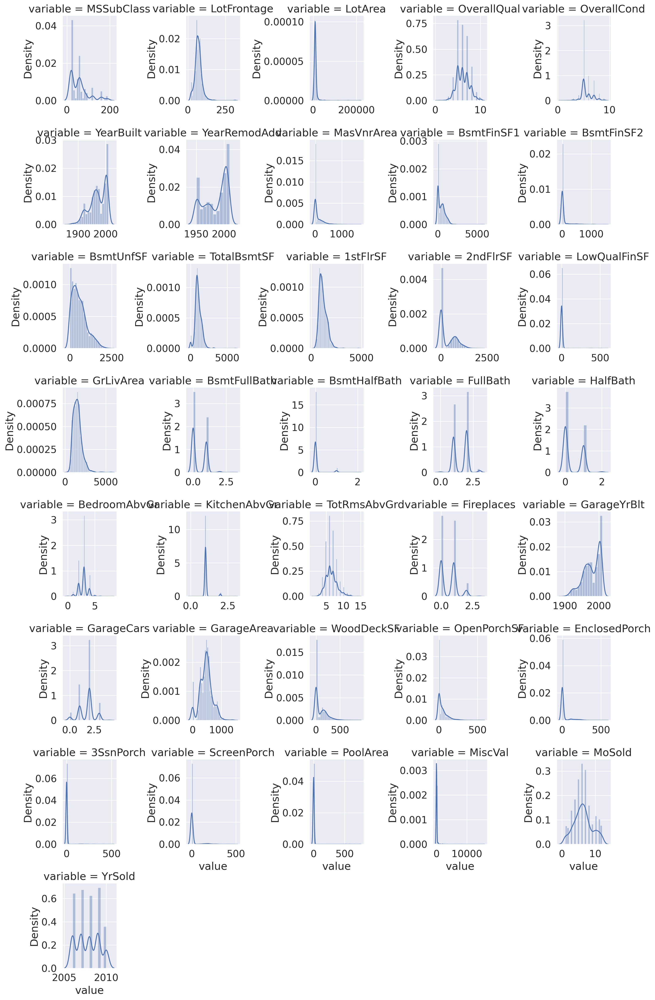

In [ ]:
#Univariate Analysis
vn = pd.melt(train, value_vars=num_var)
fig = sns.FacetGrid(vn, col="variable",  col_wrap=5, sharex=False, sharey=False) # we using FacetGrid
fig = fig.map(sns.distplot, "value")
plt.show()

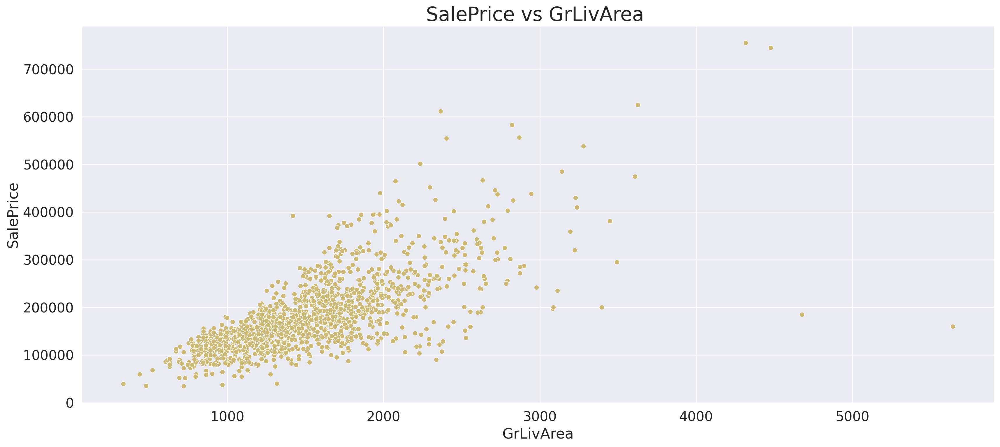

In [ ]:
##Bi-Variate Analysis
plt.figure(figsize=(18,8));
sns.scatterplot(data=train, x='GrLivArea', y='SalePrice' , color='y')
plt.title('SalePrice vs GrLivArea ', fontsize=24)
plt.show()

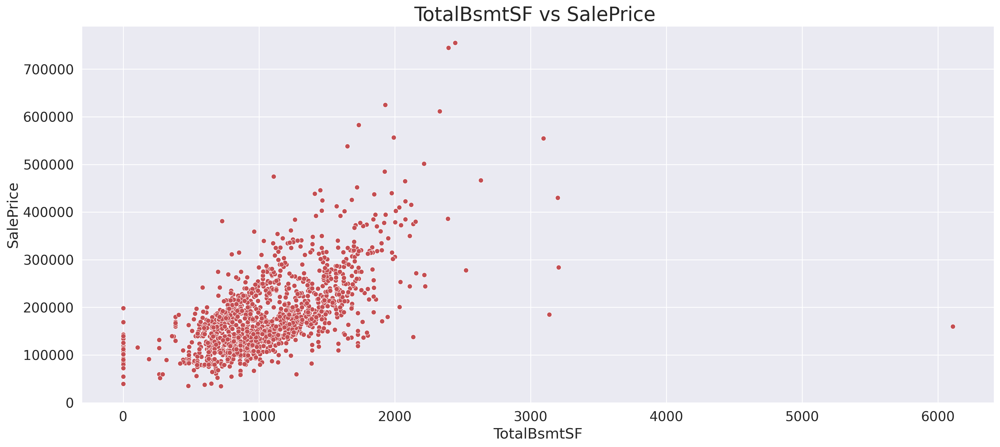

In [ ]:
##The scatter plot shows a strongly positive relation between Sale Price and Groud Living Area, the bigger the area the higher the price
plt.figure(figsize=(18,8));
# OverallQual , GarageArea ,GrLivArea , TotalBsmtSF , YearBuilt , Fireplaces , FullBath ,MasVnrArea , YearRemodAdd , OpenPorchSF , BsmtFinSF1 , WoodDeckSF , LotFrontage
sns.scatterplot(data=train, y='SalePrice', x='TotalBsmtSF', color='r')
plt.title('TotalBsmtSF vs SalePrice ', fontsize=24)
plt.show()

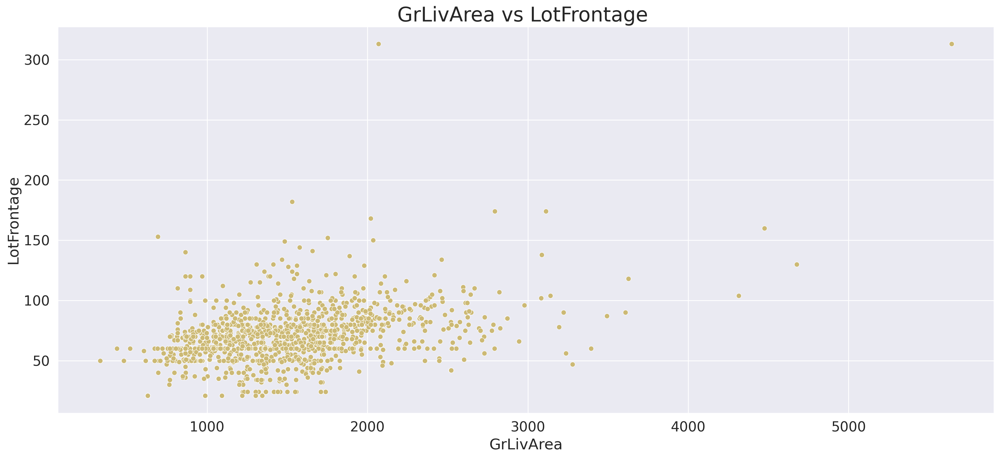

In [ ]:
##The scatter plot shows moderate positive relation between Sale Price and total basement, the bigger the total area of basement the higher the price
plt.figure(figsize=(18,8));
sns.scatterplot(data=train, x='GrLivArea', y='LotFrontage' , color='y')
plt.title('GrLivArea vs LotFrontage ', fontsize=24)
plt.show()

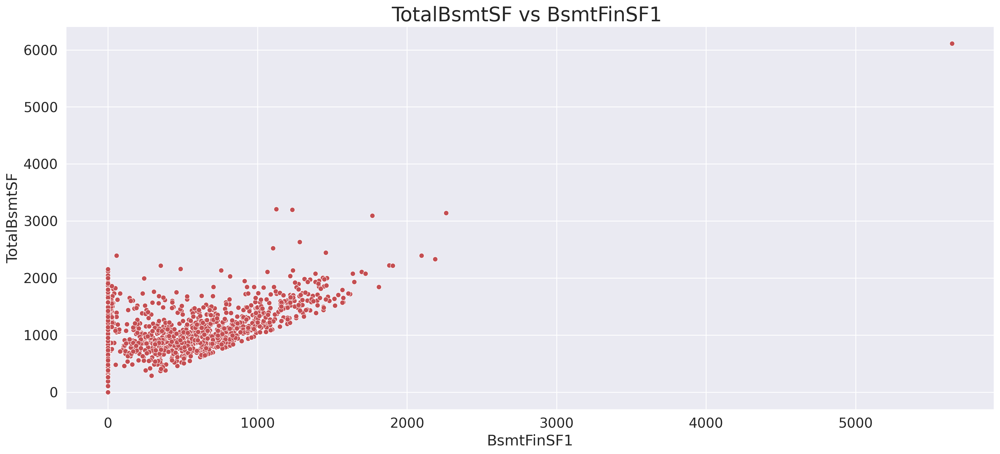

In [ ]:
##The scatter shows us there is a no relationship between GrLivArea and LotFrontage .
plt.figure(figsize=(18,8));
sns.scatterplot(data=train, y='TotalBsmtSF', x='BsmtFinSF1' ,  color='r')
plt.title('TotalBsmtSF vs BsmtFinSF1 ', fontsize=24)
plt.show()

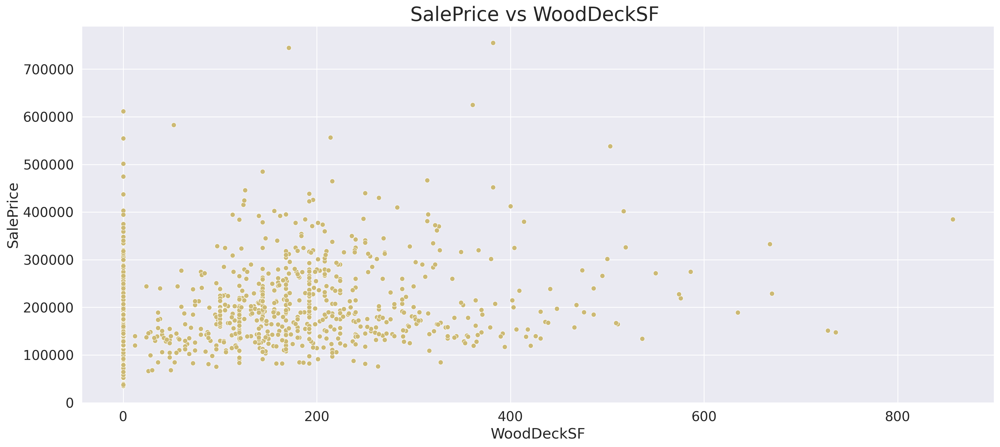

In [ ]:
##The scatter shows us there is a weak relationship between TotalBsmtSF and BsmtFinSF1.
plt.figure(figsize=(18,8));
sns.scatterplot(data=train, y='SalePrice', x='WoodDeckSF' , color='y')
plt.title('SalePrice vs WoodDeckSF ', fontsize=24)
plt.show()

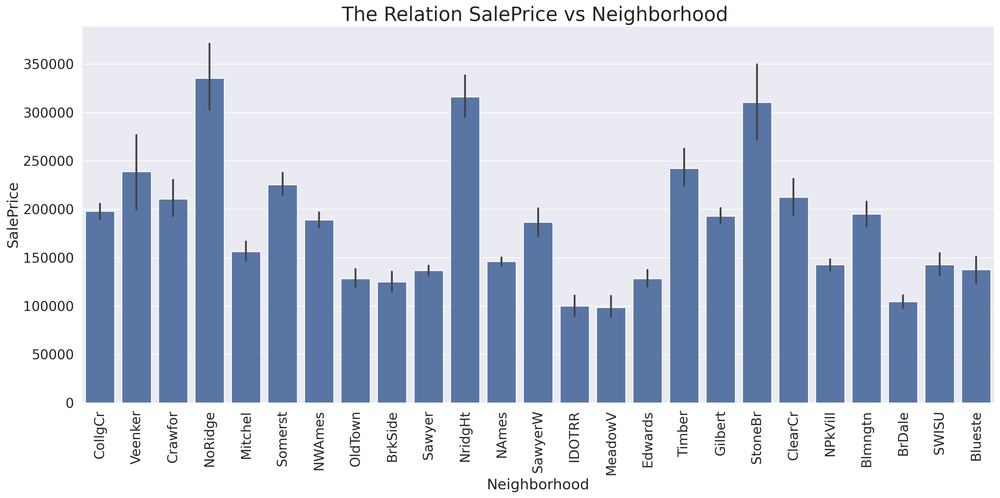

In [ ]:
##this plot show us how is sale price diffrs based on the Neighborhood, the Northridge and Northridge Heights has highest sale price
ax = plt.figure(figsize=(18,8));
ax=sns.barplot(data=train, y='SalePrice', x="Neighborhood" )
ax.set_xticklabels(train["Neighborhood"].unique().astype(str), rotation='vertical')#this line to control the labels in x axs
plt.title('The Relation SalePrice vs Neighborhood ', fontsize=24)
plt.show()

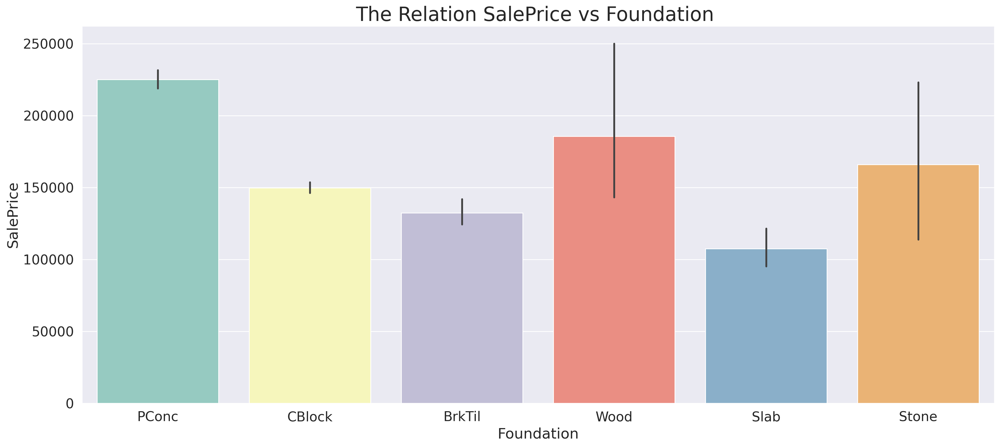

In [ ]:
##this plot shows us how is the sale price diffres based on Foundation, Poured Contrete has highest price and Slab has lowes price
plt.figure(figsize=(18,8));
sns.barplot(data=train, y='SalePrice', x="Foundation" ,   palette='Set3')
plt.title('The Relation SalePrice vs Foundation ', fontsize=24)
plt.show()

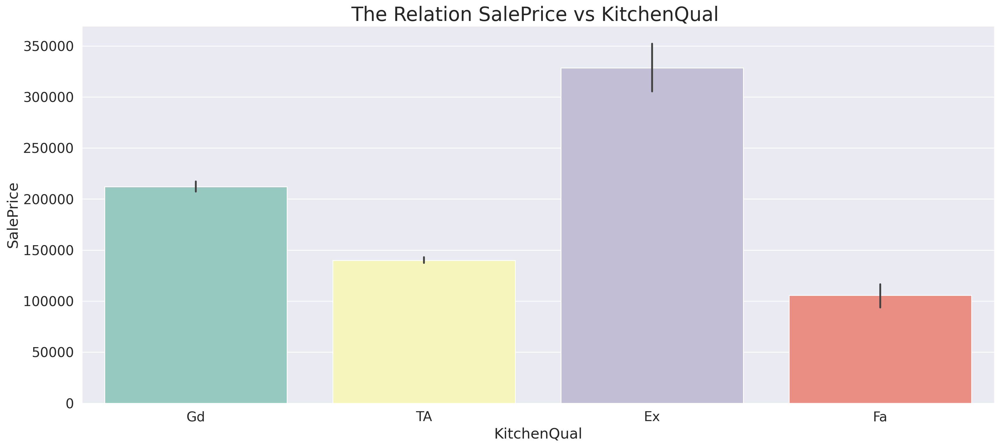

In [ ]:
##the plot above show us is the sale price differs based on KitchenQual, if the Kitchen was xcellent qulity has highest price and if it was Fair qulity has owes price
plt.figure(figsize=(18,8));
sns.barplot(data=train, y='SalePrice', x="KitchenQual", palette='Set3')
plt.title('The Relation SalePrice vs KitchenQual ', fontsize=24)
# sns.histplot(data=train, x='SaleCondition',hue="KitchenQual", multiple="dodge", shrink=.8 ,  )
plt.show()

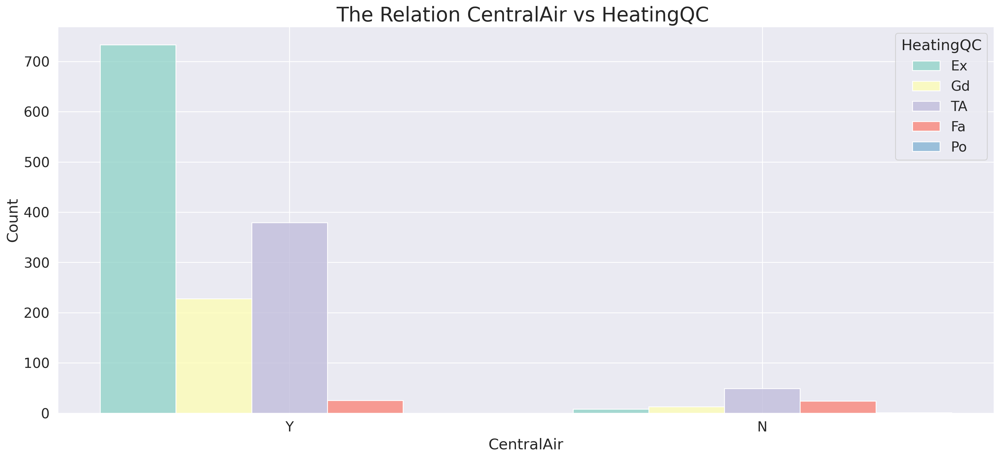

In [ ]:
##It doesn't look like there is a relationship here between CentralAir and HeatingQC.
plt.figure(figsize=(18,8));
sns.histplot(data=train, x='CentralAir',multiple="dodge", shrink=.8  , hue='HeatingQC' ,palette='Set3')
plt.title('The Relation CentralAir vs HeatingQC ', fontsize=24)
plt.show()

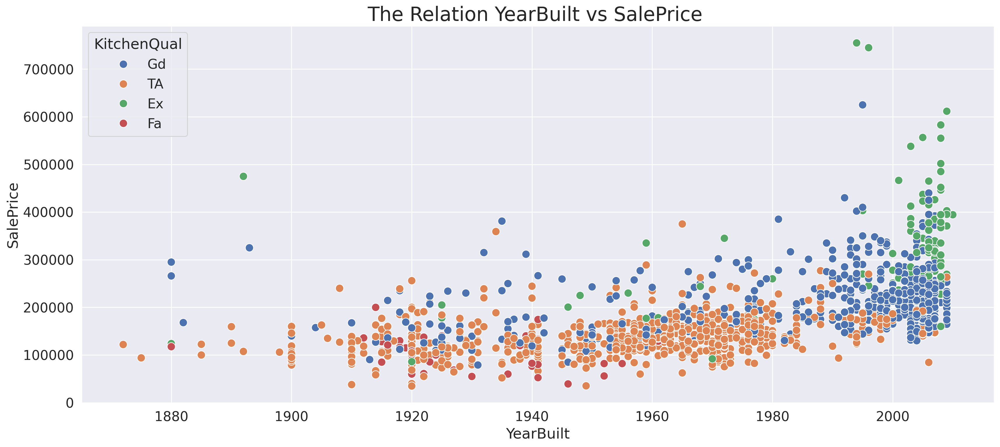

In [ ]:
##Categorical and Continuous,,,We built boxplots combined with swarmplots or use scatter plot with hue or use catplot from seaborn
##The scatter shows us a gap when YearBulit was in 40's , We notice that in 2000's the quality of kitchen improved.and gitting really high and most of it were Excellent and So, SalePrice of house increased.
plt.figure(figsize=(18,8));
sns.scatterplot(data=train, y='SalePrice', x='YearBuilt',s=100,hue='KitchenQual')
plt.title('The Relation YearBuilt vs SalePrice ', fontsize=24)
plt.show()

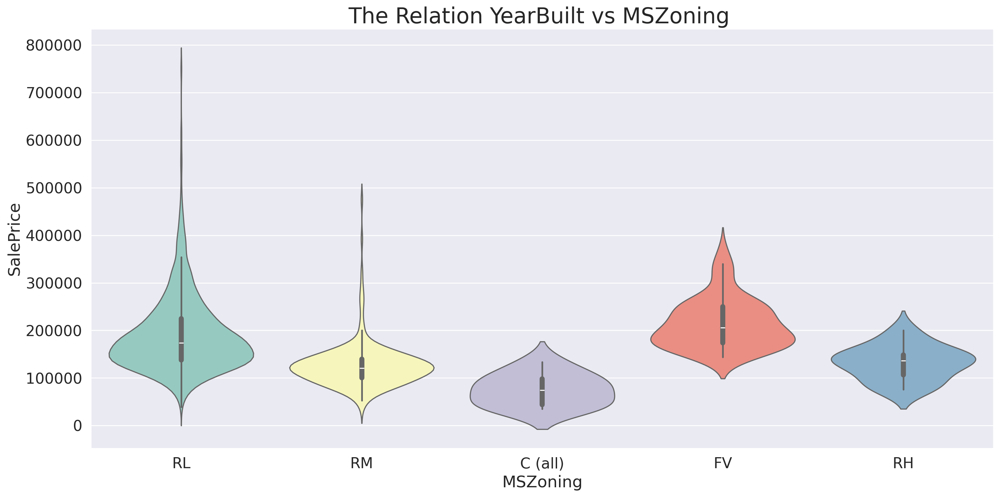

In [ ]:
##The plot show us the importance of location zone to house sale price. The Floating Village Residential(FV) zone has highest sale price on the other hand the Commercial(C) zone has lowest sale price.
plt.figure(figsize=(16,8)) # optional
sns.violinplot(x="MSZoning", y="SalePrice", data=train , palette='Set3');
plt.title('The Relation YearBuilt vs MSZoning ', fontsize=24);

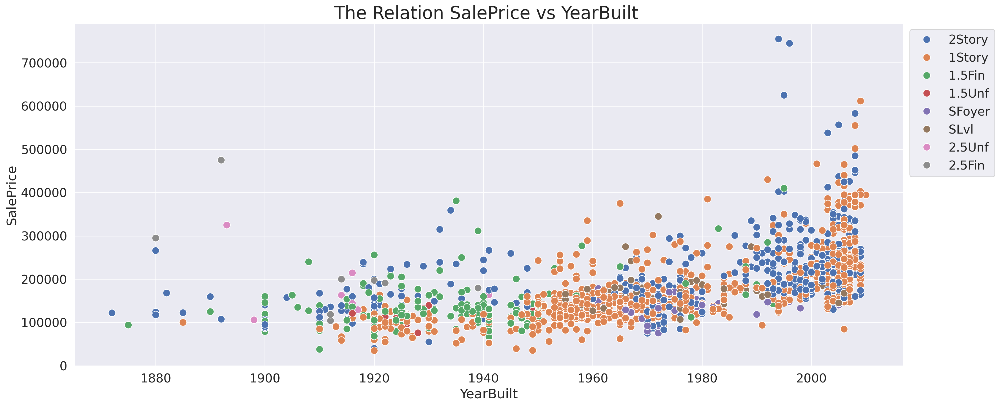

In [ ]:
##The scatter shows us the relationship between the house sale price and house year bulit, the new houses has higher price. There is a gap in house sales when YearBulit was in 40's , At the begganing of 1950, the 1story became the popular house style.
ax=plt.figure(figsize=(18,8))
ax=sns.scatterplot(data=train, y='SalePrice', x='YearBuilt',s=100,hue='HouseStyle' , markers =True)
ax.legend(bbox_to_anchor=(1,1),loc='upper left')#this line to change position of huebox
plt.title('The Relation SalePrice vs YearBuilt ', fontsize=24);
plt.show()

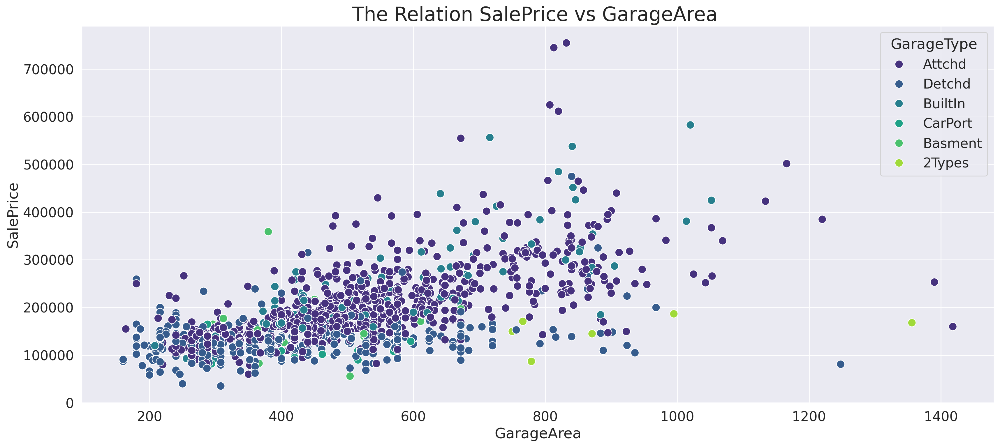

In [ ]:
##The scatter shows us a strong relation between SalePrice and GarageArea, the SalePrice get higher when GarageArea between 700-900. We notice the most common type of Garage is Attched.
plt.figure(figsize=(18,8));
sns.scatterplot(data=train, y='SalePrice', x='GarageArea',s=100  , hue='GarageType' , palette='viridis')
plt.title('The Relation SalePrice vs GarageArea ', fontsize=24);
plt.show()

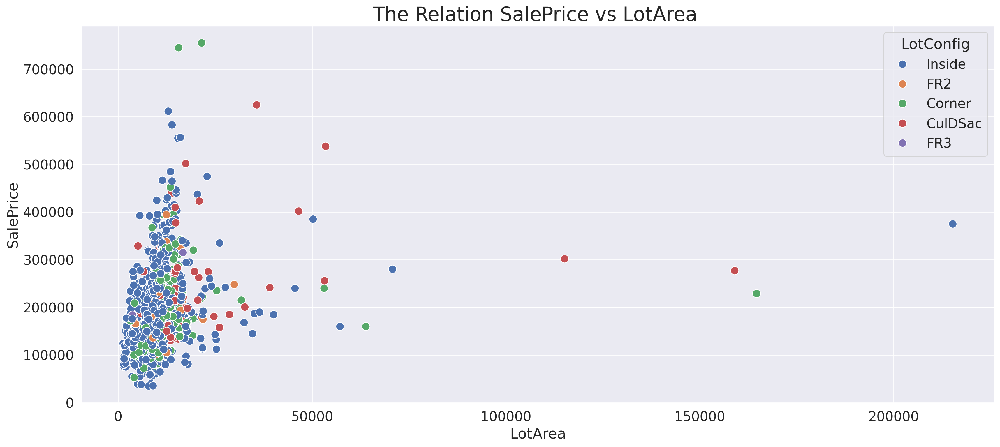

In [ ]:
##There is no relation between Saleprice and LotArea, but, we notice the LotArea of most houses less than 25000 square feet and most of them 'inside' lot.
plt.figure(figsize=(18,8));
sns.scatterplot(data=train, y='SalePrice', x='LotArea',s=100  , hue='LotConfig')
plt.title('The Relation SalePrice vs LotArea ', fontsize=24);
plt.show()

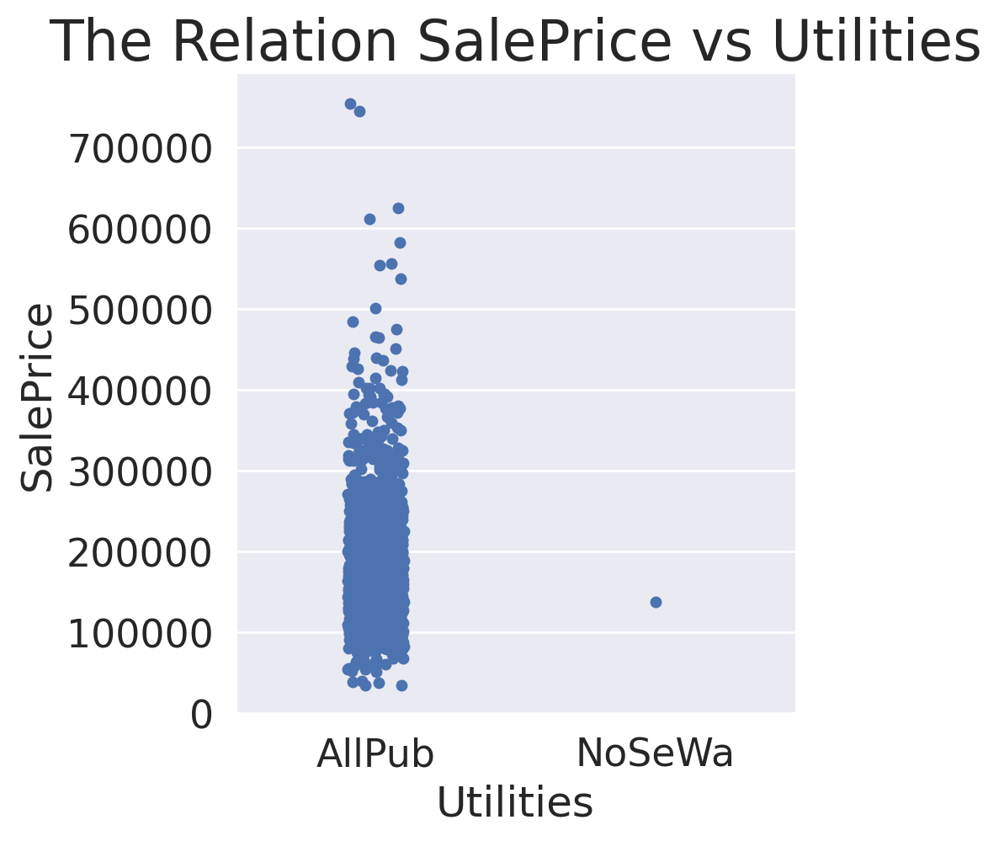

In [ ]:
##The scatter shows us the most of houses has All public Utilities (Electricity,Gas,Water, Septic Tank)
sns.catplot(x="Utilities", y="SalePrice", data=train)
plt.title('The Relation SalePrice vs Utilities', fontsize=24);
plt.show()

<Axes: >

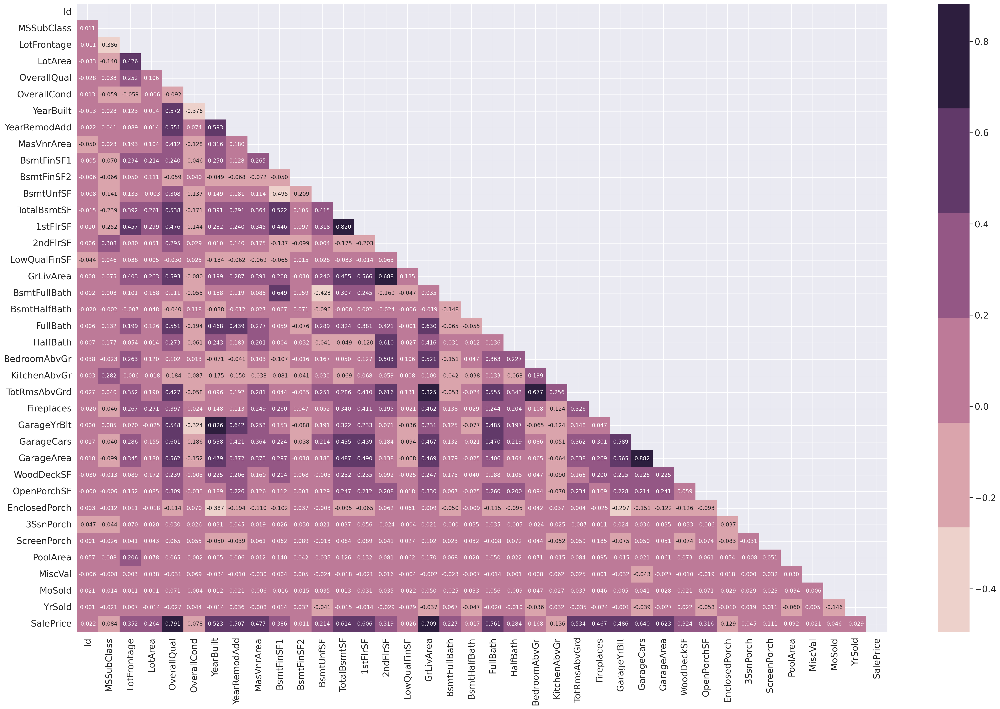

In [ ]:
##Heatmap
train_copy = train.copy()

mask = np.zeros_like(train_copy.corr(),dtype=bool)
mask[np.triu_indices_from(mask)] = True

## Heatmap visualization
plt.figure(figsize=(30,20))
sns.heatmap(train_copy.corr(),
            annot=True,
            fmt=".3f",
            annot_kws = {"size":10},
            cmap=sns.cubehelix_palette(),
            mask=mask)

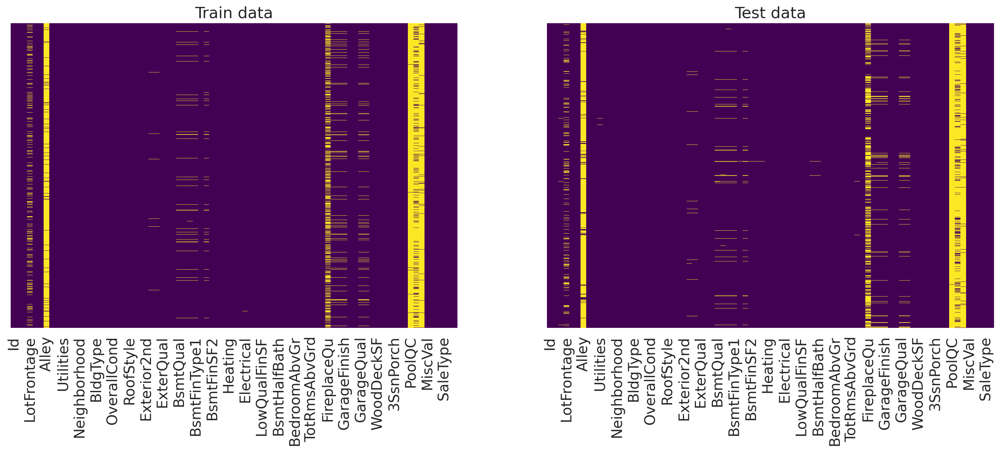

In [ ]:
##Missing Data
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (18, 6))

# train data
sns.heatmap(train.isnull(), yticklabels=False, ax = ax[0], cbar=False, cmap='viridis')
ax[0].set_title('Train data')

# test data
sns.heatmap(test.isnull(), yticklabels=False, ax = ax[1], cbar=False, cmap='viridis')
ax[1].set_title('Test data');

In [ ]:
##Dealing with Missing Values:
train.isna().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64

In [ ]:
test.isna().sum()

Id                 0
MSSubClass         0
MSZoning           4
LotFrontage      227
LotArea            0
                ... 
MiscVal            0
MoSold             0
YrSold             0
SaleType           1
SaleCondition      0
Length: 80, dtype: int64

In [ ]:
#Dealing with Missing Values of 'Alley' Feature
#in documntaion N/A value means No alley access so,
#it dose not mean a misiing value we replace it to 0 and "Grvl" = 1 ,  "Pave"= 2
#on train:
title_mapping = {"Grvl": 1, "Pave": 2 , np.nan: 0}
train['Alley'] = train['Alley'].map(title_mapping)
#on test:
title_mapping = {"Grvl": 1, "Pave": 2 , np.nan: 0}
test['Alley'] = test['Alley'].map(title_mapping)
#Dealing with Missing Values of 'LotFrontage' Feature
#on train:
train.LotFrontage.replace(np.nan , train.LotFrontage.mean() , inplace=True)
#on test:
test.LotFrontage.replace(np.nan , test.LotFrontage.mean() , inplace=True)
#Dealing with Missing Values of 'MasVnrType' Feature
#on train:
train.MasVnrType.replace(np.nan , 'None'  , inplace=True)# None it's a value in MasVnrType we set type of Veneer is not provided
#on test:
test.MasVnrType.replace(np.nan , 'None'  , inplace=True)# highest value
#Dealing with Missing Values of 'MasVnrArea' Feature
#on train:
train.MasVnrArea.replace(np.nan , 0.0  , inplace=True)
#on test:
test.MasVnrArea.replace(np.nan , 0.0  , inplace=True)
#Dealing with Missing Values of 'BsmtQual' Feature
#on train:
train.BsmtQual.replace(np.nan , 'NB'  , inplace=True)#NB = NO Basement
#on test:
test.BsmtQual.replace(np.nan , 'NB'  , inplace=True)#NB = NO Basement
#Dealing with Missing Values of 'BsmtCond' Feature
#on train:
train.BsmtCond.replace(np.nan , 'NB'  , inplace=True) #NB = NO Basement
#on test:
test.BsmtCond.replace(np.nan , 'NB'  , inplace=True) #NB = NO Basement
#Dealing with Missing Values of 'BsmtExposure' Feature
#on train:
train.BsmtExposure.replace(np.nan , 'NB'  , inplace=True) #NB = NO Basement
#on test:
test.BsmtExposure.replace(np.nan , 'NB'  , inplace=True) #NB = NO Basement
#Dealing with Missing Values of 'BsmtFinType1' Feature
#on train:
train.BsmtFinType1.replace(np.nan , 'NB'  , inplace=True) #NB = NO Basement
#on test:
test.BsmtFinType1.replace(np.nan , 'NB'  , inplace=True) #NB = NO Basement
#Dealing with Missing Values of 'BsmtFinType2' Feature
#on train:
train.BsmtFinType2.replace(np.nan , 'NB'  , inplace=True) #NB = NO Basement
#on test:
test.BsmtFinType2.replace(np.nan , 'NB'  , inplace=True) #NB = NO Basement
#Dealing with Missing Values of 'Electrical' Feature
#on train:
train.Electrical.replace(np.nan , 'SBrkr'  , inplace=True) #the highest value
#on test:
test.Electrical.replace(np.nan , 'SBrkr'  , inplace=True)
#Dealing with Missing Values of 'FireplaceQu' Feature
#on train:
train.FireplaceQu.replace(np.nan , 'NF'  , inplace=True)   #NF No Fireplace
#on test:
test.FireplaceQu.replace(np.nan , 'NF'  , inplace=True)   #NF No Fireplace
#Dealing with Missing Values of 'GarageType' Feature
#on train:
train.GarageType.replace(np.nan , 'NG'  , inplace=True) #NG No Garage
#on test:
test.GarageType.replace(np.nan , 'NG'  , inplace=True) #NG No Garage
#Dealing with Missing Values of 'GarageYrBlt' Feature
#since the house has graage type = NG (means No Garage) we set GarageYrBlt to 0
#on train:
for i , item in train.GarageType.iteritems() :
    if item  == 'NG':#NG No Garage
         train.GarageYrBlt.iloc[i]=0

#on test:
for i , item in test.GarageType.iteritems():
    if item  == 'NG':#NG No Garage
         test.GarageYrBlt.iloc[i] = 0
    else:
        test.GarageYrBlt.replace(np.nan ,  test.GarageYrBlt.mean() , inplace=True)


#Dealing with Missing Values of 'GarageFinish' Feature
#on train:
train.GarageFinish.replace(np.nan , 'NG'  , inplace=True) #NG No Garage
#on test:
test.GarageFinish.replace(np.nan , 'NG'  , inplace=True) #NG No Garage
#Dealing with Missing Values of 'GarageQual' Feature
#on train:
train.GarageQual.replace(np.nan , 'NG'  , inplace=True) #NG No Garage
#on test:
test.GarageQual.replace(np.nan , 'NG', inplace=True) #NG No Garage
#Dealing with Missing Values of 'GarageCond' Feature
#on train:
train.GarageCond.replace(np.nan , 'NG'  , inplace=True) #NG No Garage
#on test:
test.GarageCond.replace(np.nan , 'NG'  , inplace=True) #NG No Garage
#Dealing with Missing Values of 'PoolQC' Feature
#on train:
train.PoolQC.replace(np.nan , 'NP'  , inplace=True) #NP = No Pool
#on test:
test.PoolQC.replace(np.nan , 'NP'  , inplace=True) #NP = No Pool
#Dealing with Missing Values of 'Fence' Feature
#on train:
train.Fence.replace(np.nan , 'NF'  , inplace=True) #NF = No Fence
#on test:
test.Fence.replace(np.nan , 'NF'  , inplace=True) #NF = No Fence
#Dealing with Missing Values of 'MiscFeature' Feature
#on train:
train.MiscFeature.replace(np.nan , 'None'  , inplace=True)
#on test:
test.MiscFeature.replace(np.nan , 'None'  , inplace=True)
#Dealing with Missing Values of 'MSZoning' Feature
#just on test:
test.MSZoning.replace(np.nan , 'RL'  , inplace=True) #the highest value
#Dealing with Missing Values of 'Utilities' Feature
#just on test:
test.Utilities.replace(np.nan , test.Utilities.mode()[0]  , inplace=True)
#Dealing with Missing Values of 'Exterior1st , Exterior2nd' Features
#just on test:
test.Exterior1st.replace(np.nan , test.Utilities.mode()[0]  , inplace=True)
test.Exterior2nd.replace(np.nan , test.Exterior2nd.mode()[0]  , inplace=True)
#Dealing with Missing Values of 'BsmtFinSF1 , BsmtFinType2' Features
#just on test in "BsmtFinSF1" :
for i , item in test.BsmtFinType1.iteritems() :
    if item  == 'NB':#NB = NO Basement
        if test.BsmtFinSF1.iloc[i]==np.nan:
             test.BsmtFinSF1.iloc[i]= 0
        else:
             test.BsmtFinSF1.iloc[i]=test.BsmtFinSF1.mean()

#just on test in "BsmtFinSF2" :
for i , item in test.BsmtFinType2.iteritems() :
    if item  == 'NB':#NB = NO Basement
        if test.BsmtFinSF2.iloc[i]==np.nan:
             test.BsmtFinSF2.iloc[i]= 0
        else:
             test.BsmtFinSF2.iloc[i]=test.BsmtFinSF2.mean()

In [ ]:
#Dealing with Missing Values of Features in test data:
#just on test:
test.BsmtUnfSF.replace(np.nan , test.BsmtUnfSF.mean() , inplace=True)
# test.BsmtUnfSF.replace(np.nan , test.TotalBsmtSF.mean() , inplace=True)
test.BsmtFullBath.replace(np.nan , test.BsmtFullBath.mean() , inplace=True)  # check if there is a basement to enhance our model
test.TotalBsmtSF.replace(np.nan , test.TotalBsmtSF.mean() , inplace=True) # check if there is a basement to enhance our model
test.BsmtHalfBath.replace(np.nan , 0 , inplace=True) # we set nan values to 0 beacuse there is no basement
test.KitchenQual.replace(np.nan , test.KitchenQual.mode()[0]  , inplace=True)
test.Functional.replace(np.nan , test.Functional.mode()[0]  , inplace=True)
test.GarageCars.replace(np.nan , test.GarageCars.mean()  , inplace=True)
test.GarageArea.replace(np.nan , test.GarageArea.mean()  , inplace=True)
test.Functional.replace(np.nan , test.Functional.mode()[0]  , inplace=True)
test.SaleType.replace(np.nan , test.SaleType.mode()[0]  , inplace=True)

In [ ]:
train.isna().sum().sum()

0

In [ ]:
test.isna().sum().sum()

0

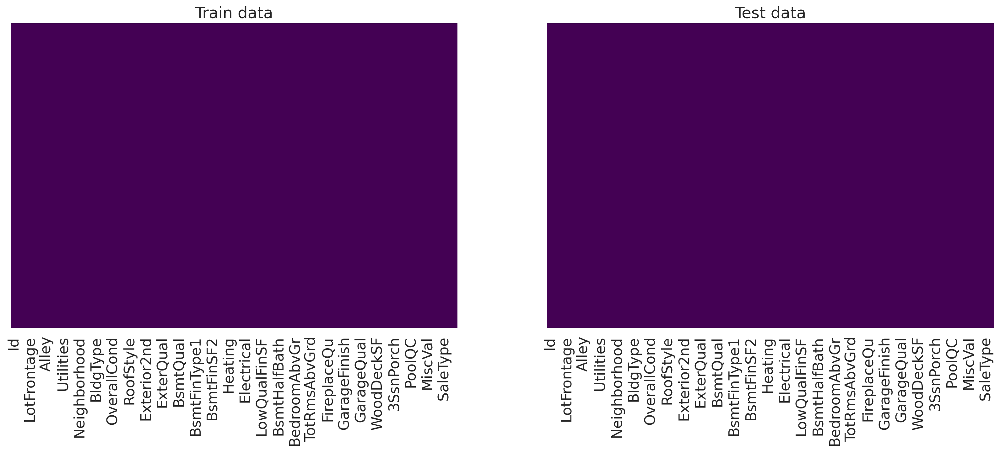

In [ ]:
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (18, 6))

# train data
sns.heatmap(train.isnull(), yticklabels=False, ax = ax[0], cbar=False, cmap='viridis')
ax[0].set_title('Train data')

# test data
sns.heatmap(test.isnull(), yticklabels=False, ax = ax[1], cbar=False, cmap='viridis')
ax[1].set_title('Test data');

In [ ]:
##Combinig Data of train and test
train2= train[['Id','OverallQual' , 'GarageArea' ,'GrLivArea' , 'TotalBsmtSF' , 'YearBuilt' , 'Fireplaces' ,
'FullBath' ,'MasVnrArea' , 'YearRemodAdd' , 'OpenPorchSF' , 'BsmtFinSF1' , 'WoodDeckSF' , 'LotFrontage','BsmtExposure'
,'Foundation' ,'Exterior1st','BldgType','Neighborhood', 'LotConfig' , 'Exterior2nd'  , 'SalePrice']]
test2 = test[['Id','OverallQual' , 'GarageArea' ,'GrLivArea' , 'TotalBsmtSF' , 'YearBuilt' , 'Fireplaces' ,
'FullBath' ,'MasVnrArea' , 'YearRemodAdd' , 'OpenPorchSF' , 'BsmtFinSF1' , 'WoodDeckSF' , 'LotFrontage','BsmtExposure'
,'Foundation' ,'Exterior1st','BldgType','Neighborhood', 'LotConfig' ,'Exterior2nd' ]]
combain = pd.merge(train2, test2 , how='outer')
combain

,Id,OverallQual,GarageArea,GrLivArea,TotalBsmtSF,YearBuilt,Fireplaces,FullBath,MasVnrArea,YearRemodAdd,...,WoodDeckSF,LotFrontage,BsmtExposure,Foundation,Exterior1st,BldgType,Neighborhood,LotConfig,Exterior2nd,SalePrice
0,1,7,548.0,1710,856.0,2003,0,2,196.0,2003,...,0,65.0,No,PConc,VinylSd,1Fam,CollgCr,Inside,VinylSd,208500.0
1,2,6,460.0,1262,1262.0,1976,1,2,0.0,1976,...,298,80.0,Gd,CBlock,MetalSd,1Fam,Veenker,FR2,MetalSd,181500.0
2,3,7,608.0,1786,920.0,2001,1,2,162.0,2002,...,0,68.0,Mn,PConc,VinylSd,1Fam,CollgCr,Inside,VinylSd,223500.0
3,4,7,642.0,1717,756.0,1915,1,1,0.0,1970,...,0,60.0,No,BrkTil,Wd Sdng,1Fam,Crawfor,Corner,Wd Shng,140000.0
4,5,8,836.0,2198,1145.0,2000,1,2,350.0,2000,...,192,84.0,Av,PConc,VinylSd,1Fam,NoRidge,FR2,VinylSd,250000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,2915,4,0.0,1092,546.0,1970,0,1,0.0,1970,...,0,21.0,No,CBlock,CemntBd,Twnhs,MeadowV,Inside,CmentBd,NaN
2915,2916,4,286.0,1092,546.0,1970,0,1,0.0,1970,...,0,21.0,No,CBlock,CemntBd,TwnhsE,MeadowV,Inside,CmentBd,NaN
2916,2917,5,576.0,1224,1224.0,1960,1,1,0.0,1996,...,474,160.0,No,CBlock,VinylSd,1Fam,Mitchel,Inside,VinylSd,NaN
2917,2918,5,0.0,970,912.0,1992,0,1,0.0,1992,...,80,62.0,Av,PConc,HdBoard,1Fam,Mitchel,Inside,Wd Shng,NaN


In [ ]:
##Dummies the columns:
num_var = [f for f in combain.columns if combain.dtypes[f] != 'object']

Q1 = combain.quantile(0.25)

Q3 = combain.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

combain1 = combain[~((combain < (Q1 - 1.5 * IQR)) |(combain > (Q3 + 1.5 * IQR))).any(axis=1)]
combain1.shape

Id               1459.0
OverallQual         2.0
GarageArea        256.0
GrLivArea         617.5
TotalBsmtSF       509.0
YearBuilt          47.5
Fireplaces          1.0
FullBath            1.0
MasVnrArea        163.5
YearRemodAdd       39.0
OpenPorchSF        70.0
BsmtFinSF1        733.0
WoodDeckSF        168.0
LotFrontage        18.0
SalePrice       84025.0
dtype: float64


(2189, 22)

In [ ]:
combain_data = pd.get_dummies(combain,drop_first=True)
combain_data.shape

(2919, 86)

In [ ]:
train3=combain_data.iloc[:563]
test3=combain_data.iloc[563:]

In [ ]:
##Modeling
##Choosing the target and the predectors for the models:
num_var = [f for f in train.columns if train.dtypes[f] != 'object']
num_var.remove('SalePrice')
num_var.remove('Id')
train1 = train.drop(['SalePrice'] , axis=1)
X_train = train[num_var]
y_train = train.SalePrice
X_test=test[num_var]

In [ ]:
##Scalling
ss = StandardScaler()
Xs_train = ss.fit_transform(X_train)
Xs_test=ss.transform(X_test)
print(Xs_train.shape , y_train.shape)

(1460, 37) (1460,)


In [ ]:
##Baseline model:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

lr_baseline = LinearRegression()
lr_baseline.fit(Xs_train,y_train)
lr_baseline.score(Xs_train,y_train)

0.8167620524695639

In [ ]:
y_pred_test = lr_baseline.predict(Xs_test)
y_pred_trai=lr_baseline.predict(Xs_train)

In [ ]:
##Calculate the RMSE error
print(f"RMSE Train: {math.sqrt(mean_squared_error(y_train, y_pred_trai))}")
print(f"R Squared Train: {r2_score(y_train, y_pred_trai)}")
print(np.std(train['SalePrice']))
print(np.mean(train['SalePrice']))

RMSE Train: 33994.749534123475
R Squared Train: 0.8167620524695639
79415.29188606751
180921.19589041095


In [ ]:
submission = pd.DataFrame({
   "Id": test["Id"],
    "SalePrice": y_pred_test
  })
submission.to_csv('submission_BL_100.csv', index=False)

In [ ]:
##RidgeCV model :
from sklearn.linear_model import RidgeCV

ridgecv = RidgeCV()
ridgecv.fit(Xs_train, y_train)

RidgeCV()

In [ ]:
ridgecv.score(Xs_train, y_train)

0.8167400985090367

In [ ]:
ridgecv.score(Xs_train, y_train)

0.8167400985090367

In [ ]:
re_rigecv=ridgecv.predict(Xs_test)

In [ ]:
submission = pd.DataFrame({
   "Id": test["Id"],
    "SalePrice": re_rigecv
  })
submission.to_csv('submission_Rigecv_100.csv', index=False)

In [ ]:
##Ridge model
from sklearn.linear_model import Ridge, Lasso, LinearRegression

ridge = Ridge( )
reg=ridge.fit(Xs_train, y_train)
scores = cross_val_score(reg, Xs_train, y_train, cv=10 )
print("Cross-validated scores:", scores)
print("Mean of Cross-validated scores:", scores.mean())

Cross-validated scores: [0.8423 0.8621 0.8879 0.7513 0.8307 0.835  0.8229 0.818  0.506  0.8378]
Mean of Cross-validated scores: 0.7994005676220567


In [ ]:
print(reg.score(Xs_train, y_train))

0.8167639842462977


In [ ]:
pre_ridge=ridge.predict(Xs_test)

In [ ]:
submission = pd.DataFrame({
   "Id": test["Id"],
    "SalePrice": pre_ridge
  })
submission.to_csv('submission_Rige_200.csv', index=False)

In [ ]:
##LassoCV model
from sklearn.linear_model import LassoCV
lassocv = LassoCV(random_state=0 , verbose =1)
lassocv.fit(Xs_train, y_train)
scores_lasso = cross_val_score(lassocv, Xs_train, y_train, cv=10)
print("Ridge Cross-validated R2-scores:", scores_lasso)
print("Mean of Ridge Cross-validated R2-scores:", scores_lasso.mean())

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Ridge Cross-validated R2-scores: [0.844  0.8345 0.8905 0.7518 0.8194 0.8097 0.8255 0.814  0.5127 0.8451]
Mean of Ridge Cross-validated R2-scores: 0.7947175011637759


In [ ]:
lassocv.score(Xs_train, y_train)

0.8155233685757899

In [ ]:
pre=lassocv.predict(Xs_test)

In [ ]:
submission = pd.DataFrame({
   "Id": test["Id"],
    "SalePrice": pre
  })
submission.to_csv('submission_lasso_100.csv', index=False)

In [ ]:
##Lasso model
from sklearn.linear_model import Lasso

lasso = Lasso()
lasso.fit(Xs_train, y_train)
scores = cross_val_score(lasso, Xs_train, y_train, cv=10)
print("Cross-validated scores:", scores)
print("Mean of Cross-validated scores:", scores.mean())


Cross-validated scores: [0.8422 0.8621 0.8879 0.7512 0.8307 0.8349 0.8228 0.8179 0.5059 0.8377]
Mean of Cross-validated scores: 0.799338027648352


In [ ]:
lasso.score( Xs_train, y_train)

0.8167642345832515

In [ ]:
pre_lasso=lasso.predict(Xs_test)

In [ ]:
submission = pd.DataFrame({
   "Id": test["Id"],
    "SalePrice": pre_lasso
  })
submission.to_csv('submission_lasso_200.csv', index=False)

In [ ]:
##ElasticNetCV model :¶
from sklearn.linear_model import ElasticNetCV

regr = ElasticNetCV(l1_ratio= 0.5,cv=5, random_state=0 , n_alphas=100)
regr.fit(Xs_train, y_train)
print(regr.alpha_)
regr.score(Xs_train, y_train)

125.63206937374339


0.14266483871387703

In [ ]:
pre_ElasticNetCV_100 = regr.predict(Xs_test)

In [ ]:
submission = pd.DataFrame({
   "Id": test["Id"],
    "SalePrice": pre_ElasticNetCV_100
  })

submission.to_csv('submission_ElasticNetCV_100.csv', index=False)

In [ ]:
##ElasticNet model
>>> from sklearn.linear_model import ElasticNet
el = ElasticNet( l1_ratio=0.5)
el1=el.fit(Xs_train, y_train)
scores = cross_val_score(el1, Xs_train, y_train, cv=10)
print("Cross-validated scores:", scores)
print("Mean of Cross-validated scores:", scores.mean())
print(el.score(Xs_train, y_train))
y_pre11=el.predict(Xs_test)

Cross-validated scores: [0.8459 0.8362 0.875  0.7549 0.7953 0.8244 0.8236 0.8085 0.533  0.8465]
Mean of Cross-validated scores: 0.7943294309537144
0.797685967827747


In [ ]:
submission = pd.DataFrame({
   "Id": test["Id"],
    "SalePrice": y_pre11
  })

submission.to_csv('submission_ElasticNet.csv', index=False)

In [ ]:
##Random Forest Regressor model
from sklearn.ensemble import RandomForestRegressor
regressor = RandomForestRegressor()
regressor.fit(Xs_train, y_train)
regressor.score(Xs_train, y_train)
predictions = regressor.predict(Xs_test)

In [ ]:
regressor.score(Xs_train, y_train)

0.9805791614014556

In [ ]:
#First, check score to see if the fitted model is reasonable
y_pred_train = regressor.predict(Xs_train)
print(f"RMSE Train: {math.sqrt(mean_squared_error(y_train, y_pred_train))}")
print(f"R Squared Train: {r2_score(y_train, y_pred_train)}")
print(np.std(train['SalePrice']))
print(np.mean(train['SalePrice']))

RMSE Train: 11067.209367822172
R Squared Train: 0.9805791614014556
79415.29188606751
180921.19589041095


In [ ]:
submission = pd.DataFrame({
   "Id": test["Id"],
    "SalePrice": predictions
  })

submission.to_csv('submission_regressor_100.csv', index=False)

In [ ]:
##Random Forest Regressor model using Pipeline and Grid Search
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
lr_pipe2 = Pipeline([
    ('sscaler2', StandardScaler()),
    ('rf', RandomForestRegressor()
)
])

pipe_2_params = { 'sscaler2__with_mean': [True, False],
                 'sscaler2__with_std': [True, False],
                 'rf__bootstrap': [True],
                  'rf__max_depth': [14],
                 'rf__max_features': [2,6,8,10],
                 'rf__min_samples_leaf': [3],
                 'rf__min_samples_split': [8],
                 'rf__n_estimators': [100,200,300]
                                   }

pipe_2_gridsearch = GridSearchCV(lr_pipe2,
                                 pipe_2_params,
                                 cv=5,
                                 verbose=1 ,n_jobs=1 )


In [ ]:
pipe_2_gridsearch.fit(X_train, y_train)

Fitting 5 folds for each of 48 candidates, totalling 240 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('sscaler2', StandardScaler()),
                                       ('rf', RandomForestRegressor())]),
             n_jobs=1,
             param_grid={'rf__bootstrap': [True], 'rf__max_depth': [14],
                         'rf__max_features': [2, 6, 8, 10],
                         'rf__min_samples_leaf': [3],
                         'rf__min_samples_split': [8],
                         'rf__n_estimators': [100, 200, 300],
                         'sscaler2__with_mean': [True, False],
                         'sscaler2__with_std': [True, False]},
             verbose=1)

In [ ]:
pre=pipe_2_gridsearch.predict(Xs_test)

In [ ]:
submission = pd.DataFrame({
   "Id": test["Id"],
    "SalePrice": pre
  })

submission.to_csv('submission_RandomForestRegresso_GS_100.csv', index=False)

In [ ]:
##Lasso Grid Search
#pipe_2_gridsearch.best_score_
model_lasso = Lasso(max_iter=100000)
grid_params = {'alpha':[1.e-5, 3.e-5, 0.0001, 0.0003, 0.001, 0.003, 0.1, 0.3]}
grid_params = {'alpha':np.linspace(0.0001, 0.001, 50)}
reg_lasso = GridSearchCV(model_lasso, grid_params,
                             cv=5, verbose=3, n_jobs=-1,
                             scoring = 'neg_root_mean_squared_error',
                             return_train_score=True) # r2
model = reg_lasso.fit(Xs_train, y_train)
reg_lasso.fit(Xs_train, y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Fitting 5 folds for each of 50 candidates, totalling 250 fits


GridSearchCV(cv=5, estimator=Lasso(max_iter=100000), n_jobs=-1,
             param_grid={'alpha': array([0.0001, 0.0001, 0.0001, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
       0.0002, 0.0003, 0.0003, 0.0003, 0.0003, 0.0003, 0.0004, 0.0004,
       0.0004, 0.0004, 0.0004, 0.0004, 0.0005, 0.0005, 0.0005, 0.0005,
       0.0005, 0.0006, 0.0006, 0.0006, 0.0006, 0.0006, 0.0007, 0.0007,
       0.0007, 0.0007, 0.0007, 0.0007, 0.0008, 0.0008, 0.0008, 0.0008,
       0.0008, 0.0009, 0.0009, 0.0009, 0.0009, 0.0009, 0.0009, 0.001 ,
       0.001 , 0.001 ])},
             return_train_score=True, scoring='neg_root_mean_squared_error',
             verbose=3)

In [ ]:
pre=reg_lasso.predict(Xs_test)

In [ ]:
submission = pd.DataFrame({
   "Id": test["Id"],
    "SalePrice": pre
  })

submission.to_csv('submission_reg_lasso_GS_100.csv', index=False)

In [ ]:
##Support Vector Machine (SVM)
from sklearn.svm import SVR
model_svr = SVR(C=20, epsilon=0.008, gamma=0.0003)
model_svr.fit(Xs_train,y_train)

SVR(C=20, epsilon=0.008, gamma=0.0003)

In [ ]:
model_svr.score(Xs_train,y_train)

-0.04895654180878206

In [ ]:
pred_svr= model_svr.predict(Xs_test)

In [ ]:
submission = pd.DataFrame({
   "Id": test["Id"],
    "SalePrice": pred_svr
  })

submission.to_csv('submission_pred_svr_100.csv', index=False)

In [ ]:
##Gradient Boosting Regressor
from sklearn.ensemble import GradientBoostingRegressor
Gboost=GradientBoostingRegressor()
Gboost.fit(Xs_train,y_train)
pred_Gboost= Gboost.predict(Xs_test)
Gboost.score(Xs_train, y_train)

0.9604613080287336

In [ ]:
submission = pd.DataFrame({
   "Id": test["Id"],
    "SalePrice": pred_Gboost
  })

submission.to_csv('submission_pred_Gboost_100.csv', index=False)

In [ ]:
##Conclusion and Recommendations
scores ={'LR': 4.5027,'RedgeCV': 0.326,'Redge': 0.327, 'LassoCV': 0.234, 'Lasso': 0.326,'elastic_net_CV': 0.392, 'elastic_net': 0.163, 'Random': 0.151, 'RandomGS': 1.025, 'LassoGS' :0.326, 'SVM': 0.416, 'GBoost': 0.145
}

ValueError: Unrecognized marker style ['o']

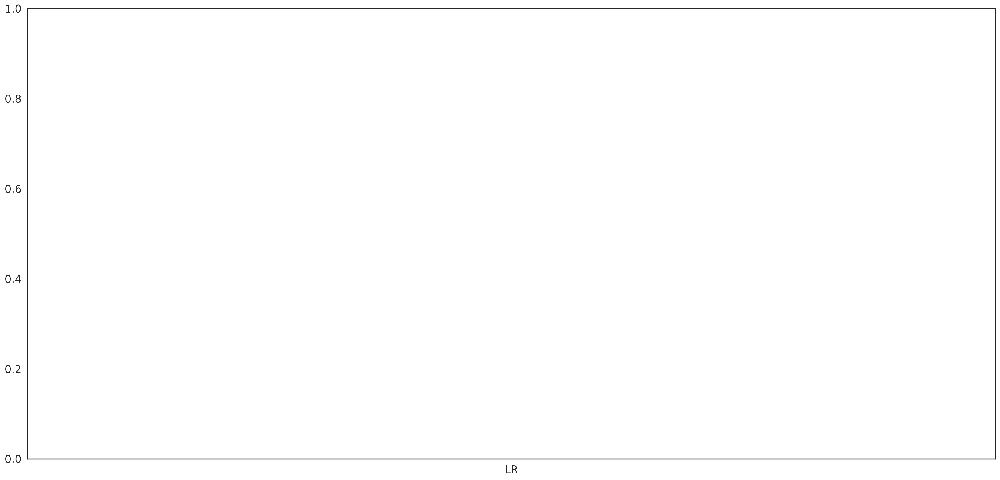

In [ ]:
# Plot the predictions for each model
sns.set_style("white")
fig  = plt.figure(figsize=(24, 12))

ax = sns.pointplot(x=list(scores.keys()), y=[score for score in scores.values()], markers=['o'])
# for i, score in enumerate(scores.values()):
#     ax.text(i, score[0] + 0.002, '{:.6f}'.format(score[0]), horizontalalignment='left', size='large', color='black', weight='semibold')

plt.ylabel('Score (RMSE)', size=20, labelpad=12.5)
plt.xlabel('Model', size=20, labelpad=12.5)
plt.tick_params(axis='x', labelsize=13.5)
plt.tick_params(axis='y', labelsize=12.5)

plt.title('Scores of Various Models', size=20)

plt.show();
